![alt text](https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcTK4gQ9nhwHHaSXMHpeggWg7twwMCgb877smkRmtkmDeDoGF9Z6&usqp=CAU)
# <font color='Blue'>Ciência dos Dados na Prática</font>

# <font color='ORANGE'> HR Analytics - Prevendo Perda de Funcionários </font>

![](https://mir-s3-cdn-cf.behance.net/project_modules/1400/7df7c475521507.5c4f4a6978056.gif)




## **O que faremos**
Neste Projeto vamos fazer uma implementação de uma análise de rotatividade de funcionários desenvolvida com a biblioteca Scikit-Learn do Python. 

Usaremos os algoritmos de Regressão Logística e Random Forest. 

No final, você poderá escolher o melhor algoritmo para seus projetos futuros em resoluções de rotatividade de funcionários.



## **Contextualização**

**O que é rotatividade de funcionários (turnover)?**

Rotatividade de funcionários ou Índice de rotatividade de funcionários é a medida do número total de funcionários que deixaram uma empresa em um determinado ano. 

Previsão de rotatividade de funcionários significa prever se um funcionário deixará a organização no próximo período.

Uma empresa usa essa análise preditiva **para medir de quantos funcionários serão necessários** se os funcionários em potencial deixarem sua organização. 

Uma empresa também usa essa análise preditiva para tornar o local de trabalho melhor para os funcionários, entendendo as **principais razões para a alta taxa de rotatividade**.

![](https://www.michaelpage.co.th/sites/michaelpage.co.th/files/legacy/Future_of_HR_BlogGIF.gif)

# 1°  Problema de Negócio

Você como Cientista de Dados deve construir uma Máquina Preditiva cujo **objetivo é prever o turnover** de funcionários da empresa.


![](https://cdn.dribbble.com/users/605032/screenshots/3196252/openwork-1-d.gif)

# 2° Análise Exploratória dos Dados



![](https://i.pinimg.com/originals/2c/63/40/2c63401c90b4ce4d0c0b434bee9cb44a.gif))

In [1]:
# Mapeando Pacotes
import pandas as pd
import numpy as np
import sys

if not sys.warnoptions:
    import warnings
    warnings.simplefilter("ignore")

In [2]:
hr = pd.read_csv('/content/rh_analytics.csv')




In [3]:
hr.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,sales,salary
0,0.38,0.53,2,157,3,0,1,0,sales,low
1,0.80,0.86,5,262,6,0,1,0,sales,medium
2,0.11,0.88,7,272,4,0,1,0,sales,medium
3,0.72,0.87,5,223,5,0,1,0,sales,low
4,0.37,0.52,2,159,3,0,1,0,sales,low


In [4]:
hr.describe()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years
count,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000
mean,0.612834,0.716102,3.803054,201.050337,3.498233,0.144610,0.238083,0.021268
std,0.248631,0.171169,1.232592,49.943099,1.460136,0.351719,0.425924,0.144281
min,0.090000,0.360000,2.000000,96.000000,2.000000,0.000000,0.000000,0.000000
25%,0.440000,0.560000,3.000000,156.000000,3.000000,0.000000,0.000000,0.000000
50%,0.640000,0.720000,4.000000,200.000000,3.000000,0.000000,0.000000,0.000000
75%,0.820000,0.870000,5.000000,245.000000,4.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,7.000000,310.000000,10.000000,1.000000,1.000000,1.000000


In [ ]:
#Instalação do Pacote
!pip install dataprep

NumExpr defaulting to 2 threads.


DataPrep Report
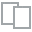
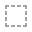
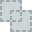
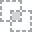
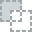
...
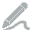
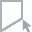
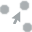
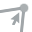
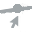

In [6]:
# Relatório Automatizado
from dataprep.eda import create_report
create_report(hr)

Nossos dados estão bem limpos, sem valores ausentes, então, vamos prosseguir e ver quantos funcionários trabalham na organização:


A coluna “esquerda” é a variável de resultado que registra um e 0. 1 para os funcionários que deixaram a empresa e 0 para os que não o fizeram.


A coluna de departamento do conjunto de dados tem muitas categorias e precisamos reduzir as categorias para melhor modelagem. Vamos ver todas as categorias da coluna do departamento:


# 3° Pré-Processamento dos Dados

Vamos adicionar todas as colunas “técnico”, “suporte” e “TI” em uma coluna para tornar nossa análise mais fácil.

In [7]:
# Alterando o nome da coluna
hr=hr.rename(columns = {'sales':'department'})

In [8]:
# Verificando os departamentos
hr['department'].unique()

array(['sales', 'accounting', 'hr', 'technical', 'support', 'management',
       'IT', 'product_mng', 'marketing', 'RandD'], dtype=object)

In [9]:
# Alterando o domínio da variável departamento
hr['department']=np.where(hr['department'] =='support', 'technical', hr['department'])
hr['department']=np.where(hr['department'] =='IT', 'technical', hr['department'])

In [10]:
hr['department'].value_counts()

technical      6176
sales          4140
product_mng     902
marketing       858
RandD           787
accounting      767
hr              739
management      630
Name: department, dtype: int64

In [11]:
 # One Hot Encoding (na mão...)
 # Criando variáveis categóricas com as variáveis departamento e salário
 
cat_vars=['department','salary']
for var in cat_vars:
    cat_list='var'+'_'+var
    cat_list = pd.get_dummies(hr[var], prefix=var)
    hr1=hr.join(cat_list)
    hr=hr1

In [ ]:
hr.describe()

In [13]:
# Eliminando as variáveis originais do one_hot_encoding

hr.drop(hr.columns[[8, 9]], axis=1, inplace=True)
hr.columns.values

array(['satisfaction_level', 'last_evaluation', 'number_project',
       'average_montly_hours', 'time_spend_company', 'Work_accident',
       'left', 'promotion_last_5years', 'department_RandD',
       'department_accounting', 'department_hr', 'department_management',
       'department_marketing', 'department_product_mng',
       'department_sales', 'department_technical', 'salary_high',
       'salary_low', 'salary_medium'], dtype=object)

In [14]:
# Separando Variáveis explicativas e Target
hr_vars=hr.columns.values.tolist()
y=['left']
X=[i for i in hr_vars if i not in y]

In [ ]:
X

# 4° Construção de Máquinas Preditivas

Seleção de recursos para previsão de rotatividade de funcionários
Vamos usar o método de seleção de recursos para decidir quais variáveis ​​são a melhor opção que pode prever a rotatividade de funcionários com grande precisão. Há um total de 18 colunas em X, e agora vamos ver como podemos selecionar cerca de 10 delas:

In [16]:
from sklearn.feature_selection import RFE

from sklearn.linear_model import LogisticRegression

model = LogisticRegression()

rfe = RFE(estimator=model, n_features_to_select=10, step=1)


#rfe = RFE(model, 10,step=1)
rfe = rfe.fit(hr[X], hr[y])
print(rfe.support_)
print(rfe.ranking_)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example

[ True  True False False  True  True  True  True False  True  True False
 False False False  True  True False]
[1 1 3 9 1 1 1 1 5 1 1 6 8 7 4 1 1 2]


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


# Como faço para saber as escolhidas?
Você pode ver que ou a seleção de recursos escolheu as 10 variáveis ​​para nós, que são marcadas como **True no array support_** e marcados com uma **opção “1” no ranking_array**. 

Agora, vamos dar uma olhada nessas colunas:

In [17]:
cols=['satisfaction_level', 'last_evaluation', 'time_spend_company', 'Work_accident', 'promotion_last_5years', 
      'department_RandD', 'department_hr', 'department_management', 'salary_high', 'salary_low'] 


In [18]:
# Criar a Máquina Preditiva Somente com as Melhores Variáveis
X=hr[cols]
y=hr['left']

In [19]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)


In [20]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

LogisticRegression()

In [21]:
from sklearn.metrics import accuracy_score
print('Logistic regression accuracy: {:.3f}'.format(accuracy_score(y_test, logreg.predict(X_test))))

Logistic regression accuracy: 0.771


In [22]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()
rf.fit(X_train, y_train)

RandomForestClassifier()

In [23]:
print('Random Forest Accuracy: {:.3f}'.format(accuracy_score(y_test, rf.predict(X_test))))

Random Forest Accuracy: 0.978


In [24]:
 from xgboost import XGBClassifier
 xgb = XGBClassifier(n_estimators=5000, learning_rate=0.8, max_depth=7)
 xgb.fit(X_train, y_train )


XGBClassifier(learning_rate=0.8, max_depth=7, n_estimators=5000)

In [25]:
print('XGboost Accuracy: {:.3f}'.format(accuracy_score(y_test, xgb.predict(X_test))))

XGboost Accuracy: 0.977


# 5° Avaliação da Máquina Final

In [26]:
# Avaliação com o Classification report
from sklearn.metrics import classification_report
print(classification_report(y_test, rf.predict(X_test)))

              precision    recall  f1-score   support

           0       0.99      0.98      0.99      3462
           1       0.95      0.96      0.95      1038

    accuracy                           0.98      4500
   macro avg       0.97      0.97      0.97      4500
weighted avg       0.98      0.98      0.98      4500



Text(0.5, 1.0, 'Random Forest')

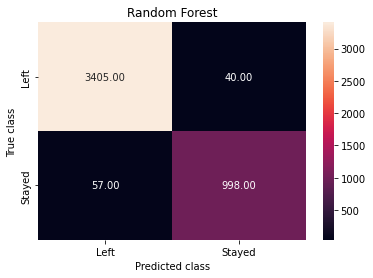

In [27]:
# Avaliação com a Confusion Matrix

y_pred = rf.predict(X_test)
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

forest_cm = metrics.confusion_matrix(y_pred, y_test)
sns.heatmap(forest_cm, annot=True, fmt='.2f',xticklabels = ["Left", "Stayed"] , yticklabels = ["Left", "Stayed"] )
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.title('Random Forest')

In [29]:
print(classification_report(y_test, logreg.predict(X_test)))

              precision    recall  f1-score   support

           0       0.81      0.92      0.86      3462
           1       0.51      0.26      0.35      1038

    accuracy                           0.77      4500
   macro avg       0.66      0.59      0.60      4500
weighted avg       0.74      0.77      0.74      4500



Text(0.5, 1.0, 'Logistic Regression')

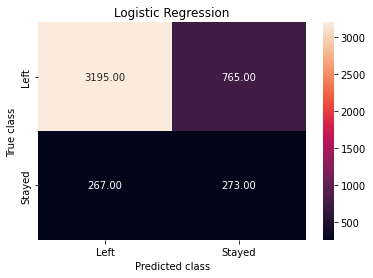

In [30]:
logreg_y_pred = logreg.predict(X_test)
logreg_cm = metrics.confusion_matrix(logreg_y_pred, y_test)
sns.heatmap(logreg_cm, annot=True, fmt='.2f',xticklabels = ["Left", "Stayed"] , yticklabels = ["Left", "Stayed"] )
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.title('Logistic Regression')

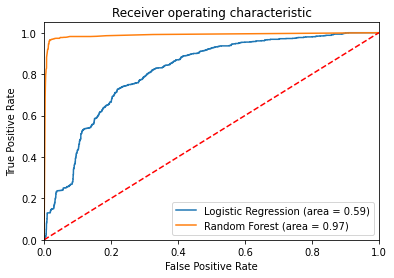

In [31]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, logreg.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, logreg.predict_proba(X_test)[:,1])
rf_roc_auc = roc_auc_score(y_test, rf.predict(X_test))
rf_fpr, rf_tpr, rf_thresholds = roc_curve(y_test, rf.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot(rf_fpr, rf_tpr, label='Random Forest (area = %0.2f)' % rf_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

A  curva de característica de operação do receptor (ROC) é uma ferramenta padrão usada com classificadores binários. A linha pontilhada vermelha representa a curva ROC de um classificador puramente aleatório; um bom classificador fica o mais longe possível dessa linha (em direção ao canto superior esquerdo).

Portanto, como podemos ver que o modelo de floresta aleatória provou ser mais útil na previsão da rotatividade de funcionários, agora vamos dar uma olhada na importância dos recursos de nosso modelo de classificação de floresta aleatória.

## Importância das Variáveis

De acordo com nosso modelo de classificação Random Forest, os aspectos acima mostram as características mais importantes que irão influenciar a saída do funcionário da empresa, em ordem crescente.

In [32]:
# Importância das Variáveis
feature_labels = np.array(['satisfaction_level', 'last_evaluation', 'time_spend_company', 'Work_accident', 'promotion_last_5years', 
      'department_RandD', 'department_hr', 'department_management', 'salary_high', 'salary_low'])
importance = rf.feature_importances_
feature_indexes_by_importance = importance.argsort()
for index in feature_indexes_by_importance:
    print('{}-{:.2f}%'.format(feature_labels[index], (importance[index] *100.0)))

department_management-0.25%
promotion_last_5years-0.26%
department_hr-0.27%
department_RandD-0.32%
salary_high-0.68%
salary_low-1.23%
Work_accident-1.51%
last_evaluation-18.27%
time_spend_company-26.41%
satisfaction_level-50.80%




![](https://cdn.videoplasty.com/gif/black-corporate-man-happy-with-his-work-stock-gif-5656-384x216.gif)


![](http://media3.giphy.com/media/3o85g78vglpRJhFgAw/giphy.gif)




#Fim

## Valeu!

### # Onde me Encontrar - Ciência dos Dados <a href="https://linktr.ee/cienciadosdados">https://linktr.ee/cienciadosdados</a>

In [ ]:
from IPython.core.display import HTML
HTML('<iframe width="320" height="180" src="https://www.youtube.com/embed/WH6_pWe2_r0" title="YouTube video player" frameborder="0" allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe>')